### 1. Imports generales
Carga librerías base para manejo de rutas, datos y visualización.

In [1]:
import os
from pathlib import Path

import numpy as np
import pandas as pd

import plotly.express as px
import plotly.graph_objects as go

import warnings

warnings.filterwarnings("ignore")

### 2. Configuración del proyecto
Define la carpeta raíz del proyecto sin exponer una ruta absoluta y fija el directorio de trabajo del notebook.

In [2]:
from pathlib import Path
import os

cwd = Path.cwd().resolve()

if cwd.name == "notebooks":
    PROJECT_DIR = cwd.parent
else:
    PROJECT_DIR = cwd

os.chdir(PROJECT_DIR)

print("Project dir:", PROJECT_DIR.name)
print("Working dir:", Path.cwd().name)

Project dir: 2026-02_airbnb-london
Working dir: 2026-02_airbnb-london


### 3. Definición de rutas
Construye las rutas a las carpetas y archivos principales del proyecto.

In [3]:
DATA_STAGING = PROJECT_DIR / "data" / "staging"
DATA_PROCESSED = PROJECT_DIR / "data" / "processed"

LISTINGS_FILE = DATA_STAGING / "london-airbnb-listings-2025_09_14.xlsx"
REVIEWS_FILE  = DATA_STAGING / "london-airbnb-reviews-2025_09_14.csv"

### 4. Lectura del dataset procesado
Carga `df_london_core` desde parquet para trabajar con la base ya filtrada.

In [4]:
df_london_core = pd.read_parquet(DATA_PROCESSED / "df_london_core.parquet")
df_london_core.shape

(44019, 13)

### 5. Copia de trabajo
Crea una copia del dataframe base para transformar variables sin tocar el original.

In [5]:
df = df_london_core.copy()

### 6. Conversión de variables numéricas
Fuerza el tipo numérico en columnas clave y revisa si aparecen valores nulos tras la conversión.

In [6]:
num_cols = [
    "latitude","longitude","price","minimum_nights","number_of_reviews",
    "reviews_per_month","calculated_host_listings_count","availability_365",
    "number_of_reviews_ltm"
]

for c in num_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce")

df[num_cols].isna().mean().sort_values(ascending=False)

latitude                          0.0
longitude                         0.0
price                             0.0
minimum_nights                    0.0
number_of_reviews                 0.0
reviews_per_month                 0.0
calculated_host_listings_count    0.0
availability_365                  0.0
number_of_reviews_ltm             0.0
dtype: float64

### 7. Conversión de fechas y fecha de referencia
Convierte `last_review` a fecha y define la fecha de referencia máxima del dataset.

In [7]:
df["last_review"] = pd.to_datetime(df["last_review"], errors="coerce")
REF_DATE = df["last_review"].max()
print("REF_DATE =", REF_DATE.date())

REF_DATE = 2025-09-17


### 8. Chequeo del rango temporal
Verifica la fecha mínima y máxima disponibles en `last_review`.

In [8]:
print("last_review min/max:", df["last_review"].min().date(), df["last_review"].max().date())

last_review min/max: 2023-09-15 2025-09-17


### 9. Recencia de reseña
Genera `days_since_last_review` y controla nulos, rango y posibles valores negativos.

In [9]:
df["days_since_last_review"] = (REF_DATE - df["last_review"]).dt.days.astype("Int64")

print("NaN days:", df["days_since_last_review"].isna().sum())
print("min/max days:", df["days_since_last_review"].min(), df["days_since_last_review"].max())
print("negativos:", (df["days_since_last_review"] < 0).sum())

NaN days: 0
min/max days: 0 733
negativos: 0


### 10. Banda de noches mínimas
Agrupa `minimum_nights` en bandas categóricas para su uso descriptivo y en el modelo.

In [10]:
df["min_nights_band"] = pd.cut(
    df["minimum_nights"],
    bins=[0, 2, 6, 89],
    labels=["1-2", "3-6", "7-89"],
    include_lowest=True
).astype("category")

### 11. Revisión de bandas de noches mínimas
Muestra la distribución de `min_nights_band` incluyendo nulos.

In [11]:
print(df["min_nights_band"].value_counts(dropna=False))

min_nights_band
1-2     26909
3-6     13751
7-89     3359
Name: count, dtype: int64


### 12. Banda de anuncios por host
Define la función auxiliar y crea `host_listings_band` a partir del número de anuncios del anfitrión.

In [12]:
def host_band(x):
    if pd.isna(x):
        return np.nan
    x = int(x)
    if x == 1:
        return "1"
    if x == 2:
        return "2"
    if 3 <= x <= 4:
        return "3-4"
    return "5+"

df["host_listings_band"] = df["calculated_host_listings_count"].apply(host_band).astype("category")

### 13. Revisión de bandas de host
Muestra la distribución de `host_listings_band` incluyendo nulos.

In [13]:
print(df["host_listings_band"].value_counts(dropna=False))

host_listings_band
5+     18659
1      15030
2       5398
3-4     4932
Name: count, dtype: int64


### 14. Definición del target
Calcula cuantiles de precio por `room_type`, conserva solo extremos y crea `y_expensive`.

In [14]:
qt = df.groupby("room_type")["price"].quantile([0.25, 0.75]).unstack()
df["q25_rt"] = df["room_type"].map(qt[0.25])
df["q75_rt"] = df["room_type"].map(qt[0.75])

mask = (df["price"] <= df["q25_rt"]) | (df["price"] >= df["q75_rt"])
df_model = df.loc[mask].copy()      #se quita el 50% del medio
df_model["y_expensive"] = (df_model["price"] >= df_model["q75_rt"]).astype(int)


df_model["y_expensive"].value_counts()

y_expensive
0    11364
1    11090
Name: count, dtype: int64

### 15. Descriptivo del target por noches mínimas
Resume cantidad total y proporción de casos caros dentro de cada banda de `minimum_nights`.

In [15]:
# Conteos absolutos
ct_min = (
    df_model
    .groupby(["min_nights_band", "y_expensive"])
    .size()
    .unstack(fill_value=0)
    .sort_index()
)

# Total por banda + % de caros
ct_min["total"] = ct_min.sum(axis=1)
ct_min["pct_expensive"] = (ct_min.get(1, 0) / ct_min["total"]).round(4)

ct_min

y_expensive,0,1,total,pct_expensive
min_nights_band,,,,
1-2,7313,6504,13817,0.4707
3-6,3109,3794,6903,0.5496
7-89,942,792,1734,0.4567


### 16. Descriptivo del target por tamaño del host
Resume cantidad total y proporción de casos caros dentro de cada banda de `host_listings_band`.

In [16]:
# Conteos absolutos
ct_host = (
    df_model
    .groupby(["host_listings_band", "y_expensive"])
    .size()
    .unstack(fill_value=0)
    .sort_index()
)

# Total por banda + % de caros
ct_host["total"] = ct_host.sum(axis=1)
ct_host["pct_expensive"] = (ct_host.get(1, 0) / ct_host["total"]).round(4)

ct_host

y_expensive,0,1,total,pct_expensive
host_listings_band,,,,
1,4165,3097,7262,0.4265
2,1511,1140,2651,0.4300
3-4,1305,1158,2463,0.4702
5+,4383,5695,10078,0.5651


### 17. Imports de modelado y definición de variables
Carga componentes de scikit-learn y define las columnas numéricas y categóricas del modelo.

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression

num_cols = [
    "availability_365",
    "reviews_per_month",
    "days_since_last_review",
    "number_of_reviews",
    "number_of_reviews_ltm",
]

cat_cols_other = ["min_nights_band", "host_listings_band"]
cat_cols = ["neighbourhood"] + cat_cols_other

### 18. Construcción de X e y
Arma la matriz de entrada, define el target y separa train/test con estratificación.

In [18]:
X = df_model[num_cols + cat_cols].copy()
y = df_model["y_expensive"].copy()

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

### 19. Selección y recodificación de neighbourhood
Elige los barrios más informativos usando solo train y recodifica el resto como `Other`.

In [19]:
# ---------------------------------------------------------
# 3) Selección Top10 neighbourhood (SOLO con TRAIN) + recode a Other
#    - n >= 200
#    - 5 con mayor tasa y=1 + 5 con menor tasa y=1
# ---------------------------------------------------------
train_tmp = pd.DataFrame({
    "neighbourhood": X_train["neighbourhood"].astype("string").str.strip(),
    "y": y_train.values
}).dropna(subset=["neighbourhood"])

stats = (
    train_tmp.groupby("neighbourhood")["y"]
             .agg(n="size", rate_y1="mean")
)

eligible = stats[stats["n"] >= 200].copy()

neigh_high = eligible.sort_values("rate_y1", ascending=False).index.tolist()
neigh_low  = eligible.sort_values("rate_y1", ascending=True).index.tolist()

top5_high = neigh_high[:5]
top5_low = []
for n in neigh_low:
    if len(top5_low) >= 5:
        break
    if n not in top5_high:
        top5_low.append(n)

top_neighbourhoods = top5_high + top5_low

print("Top5 y=1 (rate alta):", top5_high)
print("Top5 y=0 (rate baja):", top5_low)
print("Total seleccionados:", len(top_neighbourhoods))

top_set = set([str(x).strip() for x in top_neighbourhoods])

def recode_neigh(s):
    s = s.astype("string").str.strip()
    return s.where(s.isin(top_set), other="Other")

X_train = X_train.copy()
X_test  = X_test.copy()
X_train["neighbourhood"] = recode_neigh(X_train["neighbourhood"])
X_test["neighbourhood"]  = recode_neigh(X_test["neighbourhood"])

Top5 y=1 (rate alta): ['Westminster', 'Kensington and Chelsea', 'Camden', 'Wandsworth', 'Islington']
Top5 y=0 (rate baja): ['Croydon', 'Lewisham', 'Waltham Forest', 'Enfield', 'Redbridge']
Total seleccionados: 10


### 20. Pipeline de preprocesado y modelo
Configura imputación, escalado, codificación categórica y la regresión logística.

In [20]:
#  armo el pipeline con OHE para neighbourhood (Top10 + Other)
#    -> drop="Other"

num_pipe = Pipeline(steps=[
    ("imp", SimpleImputer(strategy="median")),
    ("sc", StandardScaler()),
])

neigh_categories = ["Other"] + top_neighbourhoods
neigh_pipe = Pipeline(steps=[
    ("imp", SimpleImputer(strategy="most_frequent")),
    ("ohe", OneHotEncoder(
        categories=[neigh_categories],
        drop=["Other"],
        handle_unknown="ignore"
    )),
])

cat_other_pipe = Pipeline(steps=[
    ("imp", SimpleImputer(strategy="most_frequent")),
    ("ohe", OneHotEncoder(drop="first", handle_unknown="ignore")),
])

preprocess = ColumnTransformer(
    transformers=[
        ("num", num_pipe, num_cols),
        ("neigh", neigh_pipe, ["neighbourhood"]),
        ("cat", cat_other_pipe, cat_cols_other),
    ],
    remainder="drop"
)

clf = Pipeline(steps=[
    ("prep", preprocess),
    ("lr", LogisticRegression(max_iter=10000))
])

### 21. Entrenamiento del modelo
Ajusta el pipeline completo sobre el conjunto de entrenamiento.

In [21]:
clf.fit(X_train, y_train)

,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators ` for more details.","[('prep', ...), ('lr', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing `.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('num', ...), ('neigh', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='passthrough'``, all remaining columns thatwere not specified in `transformers`, but present in the data passedto `fit` will be automatically passed through. This subset of columnsis concatenated with the output of the transformers. For dataframes,extra columns not seen during `fit` will be excluded from the outputof `transform`.By setting ``remainder`` to be an estimator, the remainingnon-specified columns will use the ``remainder`` estimator. Theestimator must support :term:`fit` and :term:`transform`.Note that using this feature requires that the DataFrame columnsinput at :term:`fit` and :term:`transform` have identical order.",'drop'
,"sparse_threshold sparse_threshold: float, default=0.3If the output of the different transformers contai

### 22. Estabilidad train vs test por variable
Grafica la tasa de `y=1` en train y test para numéricas, categóricas y dummies de `neighbourhood` usando la misma lista Top10 del modelo.

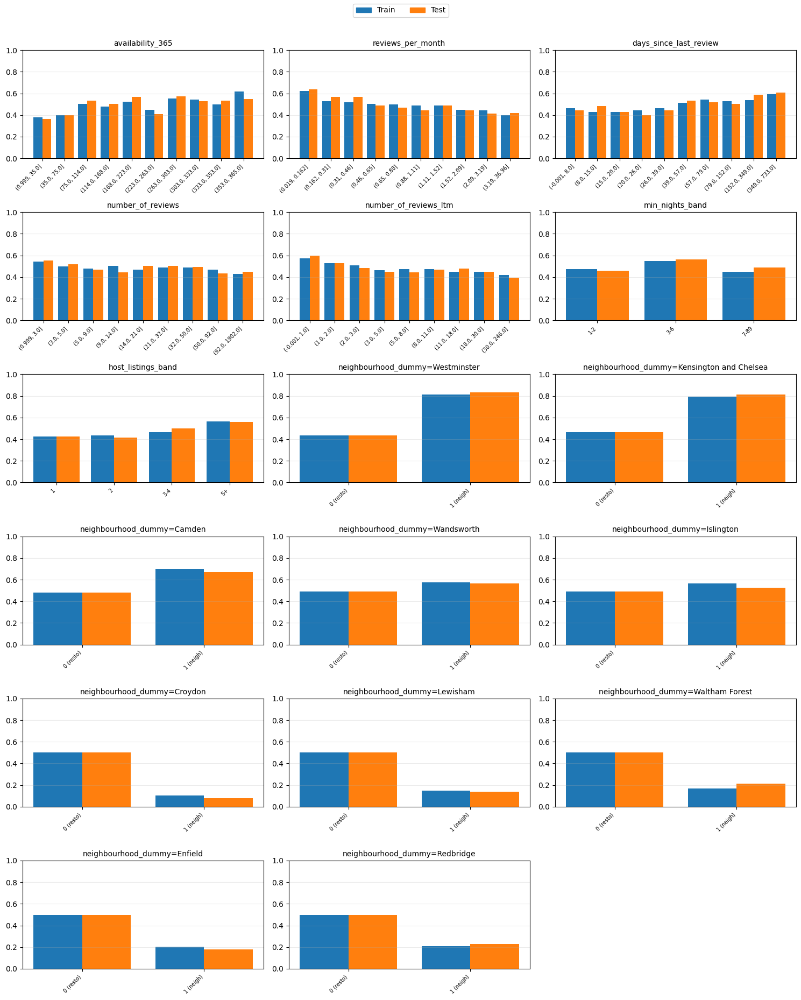

In [22]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

y_tr = pd.Series(y_train, index=X_train.index).astype(int)
y_te = pd.Series(y_test, index=X_test.index).astype(int)

def _safe_reindex(series, levels):
    return series.reindex(levels).astype(float)

def rates_numeric(col, q=10):
    tmp = pd.DataFrame({"x": X_train[col], "y": y_tr}).dropna()
    if tmp["x"].nunique() < 2:
        return None

    q_eff = min(q, tmp["x"].nunique())
    _, bins = pd.qcut(tmp["x"], q=q_eff, retbins=True, duplicates="drop")
    bins = np.unique(bins)
    if len(bins) < 3:
        return None

    tr_bins = pd.cut(X_train[col], bins=bins, include_lowest=True)
    te_bins = pd.cut(X_test[col],  bins=bins, include_lowest=True)

    r_tr = y_tr.groupby(tr_bins, observed=False).mean()
    r_te = y_te.groupby(te_bins, observed=False).mean()

    levels = tr_bins.cat.categories
    r_tr = _safe_reindex(r_tr, levels)
    r_te = _safe_reindex(r_te, levels)

    xlabels = [str(iv) for iv in levels]
    return xlabels, r_tr.values, r_te.values


def rates_categorical(col):
    tr = X_train[col].astype(str)
    te = X_test[col].astype(str)

    r_tr = y_tr.groupby(tr, observed=False).mean()
    r_te = y_te.groupby(te, observed=False).mean()

    if isinstance(X_train[col].dtype, pd.CategoricalDtype):
        levels = [str(x) for x in X_train[col].cat.categories.tolist()]
    else:
        levels = r_tr.index.tolist()

    for k in r_te.index.tolist():
        if k not in levels:
            levels.append(k)

    r_tr = _safe_reindex(r_tr, levels)
    r_te = _safe_reindex(r_te, levels)

    return levels, r_tr.values, r_te.values

def rates_neigh_dummy(neigh):
    d_tr = (X_train["neighbourhood"].astype(str) == neigh).astype(int)
    d_te = (X_test["neighbourhood"].astype(str) == neigh).astype(int)

    r_tr = y_tr.groupby(d_tr, observed=False).mean().reindex([0, 1])
    r_te = y_te.groupby(d_te, observed=False).mean().reindex([0, 1])

    xlabels = ["0 (resto)", "1 (neigh)"]
    return xlabels, r_tr.values.astype(float), r_te.values.astype(float)


plots = []  # (title, xlabels, train_vals, test_vals)

for col in num_cols:
    out = rates_numeric(col, q=10)
    if out is None:
        continue
    xlabels, vtr, vte = out
    plots.append((col, xlabels, vtr, vte))

for col in ["min_nights_band", "host_listings_band"]:
    if col in X_train.columns:
        xlabels, vtr, vte = rates_categorical(col)
        plots.append((col, xlabels, vtr, vte))

# Dummies
for neigh in top_neighbourhoods:
    xlabels, vtr, vte = rates_neigh_dummy(neigh)
    plots.append((f"neighbourhood_dummy={neigh}", xlabels, vtr, vte))

n = len(plots)
ncols = 3
nrows = int(np.ceil(n / ncols))

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5.0 * ncols, 3.1 * nrows))
axes = np.array(axes).reshape(-1)

bar_w = 0.40
gap = 0.0
for ax, (title, xlabels, vtr, vte) in zip(axes, plots):
    x = np.arange(len(xlabels))
    ax.bar(x - bar_w/2 + gap, vtr, width=bar_w, color="tab:blue")
    ax.bar(x + bar_w/2 + gap, vte, width=bar_w, color="tab:orange")
    ax.set_title(title, fontsize=10)
    ax.set_ylim(0, 1)
    ax.set_xticks(x)
    ax.set_xticklabels(xlabels, rotation=45, ha="right", fontsize=7)
    ax.grid(True, axis="y", alpha=0.25)

for ax in axes[len(plots):]:
    ax.axis("off")

handles = [
    Patch(color="tab:blue", label="Train"),
    Patch(color="tab:orange", label="Test")
]
fig.legend(handles=handles, loc="upper center", ncol=2)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


### 23. Probabilidades del modelo
Calcula las probabilidades predichas de la clase cara en train y test para reutilizarlas en las celdas siguientes.

In [ ]:
p_train = clf.predict_proba(X_train)[:, 1]
p_test  = clf.predict_proba(X_test)[:, 1]

### 24. Métricas base del clasificador
Calcula AUC y Log Loss sobre las probabilidades predichas en test.

In [ ]:
from sklearn.metrics import roc_auc_score, log_loss

print("AUC:", roc_auc_score(y_test, p_test))
print("LogLoss:", log_loss(y_test, p_test))

AUC: 0.7675876730680505
LogLoss: 0.5732155566022638


### 25. Inspección de la matriz transformada
Muestra una muestra de filas ya preprocesadas junto con los nombres finales de features.

In [25]:
X_train_t = clf.named_steps["prep"].transform(X_train.iloc[:50])
feat_names = clf.named_steps["prep"].get_feature_names_out()

X_train_df = pd.DataFrame(
    X_train_t.toarray() if hasattr(X_train_t, "toarray") else X_train_t,
    columns=feat_names
)
X_train_df.head()

,num__availability_365,num__reviews_per_month,num__days_since_last_review,num__number_of_reviews,num__number_of_reviews_ltm,neigh__neighbourhood_Westminster,neigh__neighbourhood_Kensington and Chelsea,neigh__neighbourhood_Camden,neigh__neighbourhood_Wandsworth,neigh__neighbourhood_Islington,neigh__neighbourhood_Croydon,neigh__neighbourhood_Lewisham,neigh__neighbourhood_Waltham Forest,neigh__neighbourhood_Enfield,neigh__neighbourhood_Redbridge,cat__min_nights_band_3-6,cat__min_nights_band_7-89,cat__host_listings_band_2,cat__host_listings_band_3-4,cat__host_listings_band_5+
0,1.031737,1.138920,-0.670300,-0.502480,-0.526400,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.227699,0.507275,-0.507492,0.630943,0.057547,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.026207,1.152652,-0.657275,0.782066,1.614737,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.549314,1.338026,-0.644251,-0.154897,0.965908,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.769367,1.777431,-0.644251,0.525157,2.523098,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


### 26. Cortes del score y zonas predichas
Define los cortes 30/70 con train y asigna zonas predichas en train y test usando una única función.

In [26]:
q30, q70 = np.quantile(p_train, [0.30, 0.70])

def zona_por_prob(p, low=q30, high=q70):
    return np.where(p <= low, "barato",
           np.where(p >= high, "caro", "estandar"))

zone_pred_train = zona_por_prob(p_train)
zone_pred_test  = zona_por_prob(p_test)

print(f"Cortes: q30={q30:.6f} | q70={q70:.6f}")

vals, cnts = np.unique(zone_pred_test, return_counts=True)
print("Distribución test:", dict(zip(vals, cnts)))
print("Distribución test %:", {v: c/len(zone_pred_test) for v, c in zip(vals, cnts)})


Cortes: q30=0.338154 | q70=0.658036
Distribución test: {np.str_('barato'): np.int64(1297), np.str_('caro'): np.int64(1330), np.str_('estandar'): np.int64(1864)}
Distribución test %: {np.str_('barato'): np.float64(0.28879982186595415), np.str_('caro'): np.float64(0.2961478512580717), np.str_('estandar'): np.float64(0.41505232687597415)}


### 27. Evaluación 3 zonas vs precio relativo
Compara la zona predicha por score contra la zona verdadera por precio relativo a `room_type`, reutilizando los scores y cortes ya calculados.

In [27]:
from sklearn.metrics import classification_report, confusion_matrix

# === y_pred: zonas por PROBABILIDAD ===
y_pred_train = zone_pred_train
y_pred_test  = zone_pred_test

# === y_true: zonas por PRECIO RELATIVO A room_type (cortes SOLO en TRAIN) ===
train_eval = df_model.loc[X_train.index, ["room_type", "price"]].copy()
test_eval  = df_model.loc[X_test.index,  ["room_type", "price"]].copy()

qt_rt = (
    train_eval
    .groupby("room_type")["price"]
    .quantile([0.30, 0.70])
    .unstack()
)

train_eval["q30_price_rt"] = train_eval["room_type"].map(qt_rt[0.30])
train_eval["q70_price_rt"] = train_eval["room_type"].map(qt_rt[0.70])

test_eval["q30_price_rt"] = test_eval["room_type"].map(qt_rt[0.30])
test_eval["q70_price_rt"] = test_eval["room_type"].map(qt_rt[0.70])

def zona_por_price_rt(price, q30_rt, q70_rt):
    return np.where(price <= q30_rt, "barato",
           np.where(price >= q70_rt, "caro", "estandar"))

y_true_train = zona_por_price_rt(
    train_eval["price"].values,
    train_eval["q30_price_rt"].values,
    train_eval["q70_price_rt"].values
)

y_true_test = zona_por_price_rt(
    test_eval["price"].values,
    test_eval["q30_price_rt"].values,
    test_eval["q70_price_rt"].values
)

labels = ["barato", "estandar", "caro"]

print(f"Cortes TRAIN | prob: q30={q30:.6f}, q70={q70:.6f}\n")

print("=== TRAIN ===")
print(classification_report(y_true_train, y_pred_train, labels=labels, digits=3, zero_division=0))

print("=== TEST ===")
print(classification_report(y_true_test, y_pred_test, labels=labels, digits=3, zero_division=0))

cm_train = confusion_matrix(y_true_train, y_pred_train, labels=labels)
cm_test  = confusion_matrix(y_true_test,  y_pred_test,  labels=labels)

print("\nConfusion TRAIN:")
print(pd.DataFrame(cm_train, index=[f"true_{l}" for l in labels], columns=[f"pred_{l}" for l in labels]))

print("\nConfusion TEST:")
print(pd.DataFrame(cm_test, index=[f"true_{l}" for l in labels], columns=[f"pred_{l}" for l in labels]))


Cortes TRAIN | prob: q30=0.338154, q70=0.658036

=== TRAIN ===
              precision    recall  f1-score   support

      barato      0.494     0.477     0.485      5584
    estandar      0.418     0.432     0.425      6951
        caro      0.544     0.541     0.542      5428

    accuracy                          0.479     17963
   macro avg      0.485     0.483     0.484     17963
weighted avg      0.480     0.479     0.479     17963

=== TEST ===
              precision    recall  f1-score   support

      barato      0.513     0.469     0.490      1417
    estandar      0.422     0.452     0.436      1742
        caro      0.548     0.547     0.548      1332

    accuracy                          0.486      4491
   macro avg      0.494     0.489     0.491      4491
weighted avg      0.488     0.486     0.486      4491


Confusion TRAIN:
               pred_barato  pred_estandar  pred_caro
true_barato           2663           2356        565
true_estandar         2059           3

### 28. Correlación entre variables numéricas
Calcula y visualiza la matriz de correlación de Spearman de las numéricas del modelo.

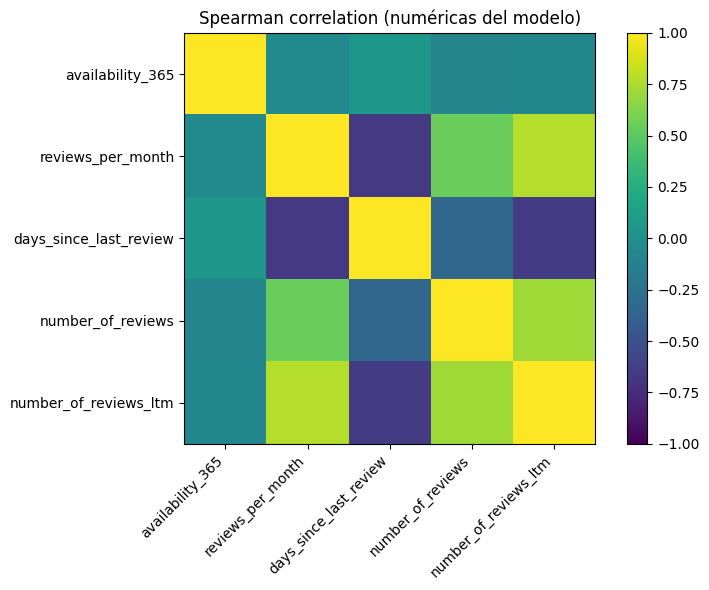

                        availability_365  reviews_per_month  \
availability_365                   1.000             -0.045   
reviews_per_month                 -0.045              1.000   
days_since_last_review             0.062             -0.672   
number_of_reviews                 -0.091              0.541   
number_of_reviews_ltm             -0.079              0.775   

                        days_since_last_review  number_of_reviews  \
availability_365                         0.062             -0.091   
reviews_per_month                       -0.672              0.541   
days_since_last_review                   1.000             -0.343   
number_of_reviews                       -0.343              1.000   
number_of_reviews_ltm                   -0.644              0.713   

                        number_of_reviews_ltm  
availability_365                       -0.079  
reviews_per_month                       0.775  
days_since_last_review                 -0.644  
number_of_revi

In [28]:
corr = df_model[num_cols].corr(method="spearman")

plt.figure(figsize=(8, 6))
plt.imshow(corr.values, vmin=-1, vmax=1)
plt.xticks(range(len(num_cols)), num_cols, rotation=45, ha="right")
plt.yticks(range(len(num_cols)), num_cols)
plt.title("Spearman correlation (numéricas del modelo)")
plt.colorbar()
plt.tight_layout()
plt.show()

print(corr.round(3))


### 29. Correlación de numéricas contra precio
Ordena las variables numéricas según su correlación de Spearman con `price`.

In [29]:
corr_price = (
    df_model[num_cols + ["price"]]
    .corr(method="spearman")[["price"]]
    .drop(index="price")
    .rename(columns={"price": "spearman_rho"})
)

corr_price["abs_rho"] = corr_price["spearman_rho"].abs()
corr_price = corr_price.sort_values("abs_rho", ascending=False)

print(corr_price.round(3).to_string())

                        spearman_rho  abs_rho
number_of_reviews_ltm         -0.129    0.129
number_of_reviews             -0.126    0.126
reviews_per_month             -0.126    0.126
availability_365               0.087    0.087
days_since_last_review         0.079    0.079


### 30. Calibración de probabilidades
Dibuja la curva de calibración y calcula Brier Score en train y test.

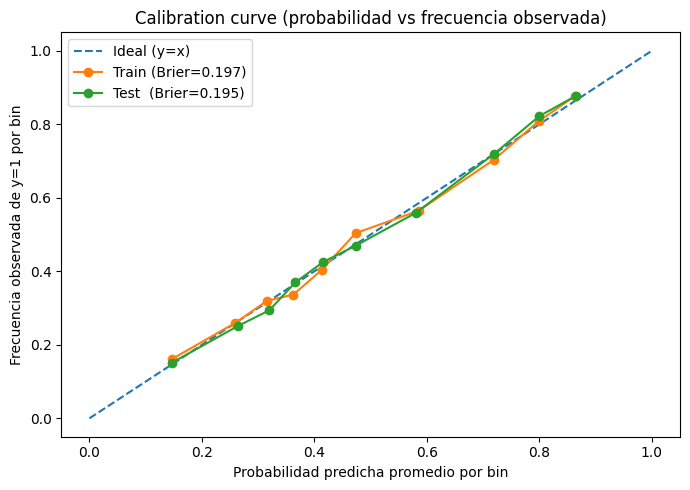

In [30]:
from sklearn.calibration import calibration_curve
from sklearn.metrics import brier_score_loss

y_train_bin = np.asarray(y_train).astype(int)
y_test_bin  = np.asarray(y_test).astype(int)

frac_pos_tr, mean_pred_tr = calibration_curve(y_train_bin, p_train, n_bins=10, strategy="quantile")
frac_pos_te, mean_pred_te = calibration_curve(y_test_bin,  p_test,  n_bins=10, strategy="quantile")

brier_tr = brier_score_loss(y_train_bin, p_train)
brier_te = brier_score_loss(y_test_bin,  p_test)

plt.figure(figsize=(7, 5))
plt.plot([0, 1], [0, 1], linestyle="--", label="Ideal (y=x)")
plt.plot(mean_pred_tr, frac_pos_tr, marker="o", label=f"Train (Brier={brier_tr:.3f})")
plt.plot(mean_pred_te, frac_pos_te, marker="o", label=f"Test  (Brier={brier_te:.3f})")

plt.title("Calibration curve (probabilidad vs frecuencia observada)")
plt.xlabel("Probabilidad predicha promedio por bin")
plt.ylabel("Frecuencia observada de y=1 por bin")
plt.legend()
plt.tight_layout()
plt.show()

### 31. Scoring sobre todo Londres
Reconstruye variables del modelo sobre `df_london_core`, calcula score y grafica las zonas predichas reutilizando las mismas definiciones del entrenamiento.

In [31]:
# Scoring sobre todo df_london_core
df_sc = df_london_core.copy()

# Coordenadas
df_sc["latitude"] = pd.to_numeric(df_sc["latitude"], errors="coerce")
df_sc["longitude"] = pd.to_numeric(df_sc["longitude"], errors="coerce")

# Fecha y recencia
df_sc["last_review"] = pd.to_datetime(df_sc["last_review"], errors="coerce")
df_sc["days_since_last_review"] = (REF_DATE - df_sc["last_review"]).dt.days.astype("Int64")

# Variables del modelo: mismas definiciones que en entrenamiento
df_sc["min_nights_band"] = pd.cut(
    df_sc["minimum_nights"],
    bins=[0, 2, 6, 89],
    labels=["1-2", "3-6", "7-89"],
    include_lowest=True
).astype("category")

df_sc["host_listings_band"] = (
    df_sc["calculated_host_listings_count"]
    .apply(host_band)
    .astype("category")
)

# Matriz de scoring
X_all = df_sc[num_cols + ["neighbourhood", "min_nights_band", "host_listings_band"]].copy()

top_set = set(pd.Series(top_neighbourhoods).astype("string").str.strip())
X_all["neighbourhood"] = (
    X_all["neighbourhood"].astype("string").str.strip()
    .where(lambda s: s.isin(top_set), other="Other")
)

# Score + zona predicha
df_sc["p_expensive"] = clf.predict_proba(X_all)[:, 1]
df_sc["zone_pred_30_70"] = zona_por_prob(df_sc["p_expensive"].values)

# Plot
df_plot = df_sc.dropna(subset=["latitude", "longitude", "zone_pred_30_70"]).copy()

fig = px.scatter_map(
    df_plot,
    lat="latitude",
    lon="longitude",
    color="zone_pred_30_70",
    hover_data=["neighbourhood", "room_type", "price", "p_expensive"],
    zoom=9,
    center={"lat": 51.5074, "lon": -0.1278},
    opacity=0.35,
    height=750
)

fig.update_layout(
    map_style="open-street-map",
    margin=dict(l=0, r=0, t=30, b=0),
    title=f"Londres — zonas predichas por score (P30={q30:.3f}, P70={q70:.3f})"
)

fig.show()


### 32. Mapas de acierto y error
Reutiliza los cortes de precio relativos a `room_type` definidos con train, marca hits/errors y genera un mapa por zona predicha.

In [32]:
needed = ["latitude", "longitude", "price", "room_type", "p_expensive", "zone_pred_30_70"]
miss = [c for c in needed if c not in df_sc.columns]
if miss:
    raise ValueError(f"Faltan columnas en df_sc: {miss}")

# Coordenadas
df_sc["latitude"] = pd.to_numeric(df_sc["latitude"], errors="coerce")
df_sc["longitude"] = pd.to_numeric(df_sc["longitude"], errors="coerce")
df_sc["price"] = pd.to_numeric(df_sc["price"], errors="coerce")

# Cortes de PRECIO relativos a room_type, definidos con TRAIN
df_sc["q30_price_rt"] = df_sc["room_type"].map(qt_rt[0.30])
df_sc["q70_price_rt"] = df_sc["room_type"].map(qt_rt[0.70])

df_sc["zone_true_price_30_70"] = np.where(
    df_sc["price"].values <= df_sc["q30_price_rt"].values, "barato",
    np.where(df_sc["price"].values >= df_sc["q70_price_rt"].values, "caro", "estandar")
)

df_sc["hit"] = np.where(
    df_sc["zone_pred_30_70"] == df_sc["zone_true_price_30_70"],
    "OK",
    "ERROR"
)

df_plot_all = df_sc.dropna(
    subset=["latitude", "longitude", "zone_pred_30_70", "zone_true_price_30_70", "hit"]
).copy()

N = 60000
if len(df_plot_all) > N:
    df_plot_all = df_plot_all.sample(N, random_state=42)

def plot_map_for_zone(zone_name):
    dfz = df_plot_all[df_plot_all["zone_pred_30_70"] == zone_name].copy()

    fig = px.scatter_map(
        dfz,
        lat="latitude",
        lon="longitude",
        color="hit",
        color_discrete_map={"OK": "blue", "ERROR": "hotpink"},
        hover_data={
            "neighbourhood": True,
            "room_type": True,
            "price": ":.0f",
            "p_expensive": ":.3f",
            "zone_pred_30_70": True,
            "zone_true_price_30_70": True,
        },
        zoom=9,
        center={"lat": 51.5074, "lon": -0.1278},
        opacity=0.85,
        height=750
    )

    fig.update_layout(
        map_style="open-street-map",
        legend_title_text="Resultado",
        margin=dict(l=0, r=0, t=40, b=0),
        title=f"Londres — Predicho '{zone_name}' | Azul=OK, Rosa=ERROR"
    )
    fig.show()

plot_map_for_zone("barato")
plot_map_for_zone("estandar")
plot_map_for_zone("caro")


### 33. Tabla final de cruces
Resume el conteo por zona predicha, zona verdadera y resultado del acierto.

In [33]:
tabla = (
    df_sc
    .groupby(["zone_pred_30_70", "zone_true_price_30_70", "hit"], observed=False)
    .size()
    .sort_values(ascending=False)
)

print(tabla.to_string())

zone_pred_30_70  zone_true_price_30_70  hit  
estandar         estandar               OK       13778
barato           estandar               ERROR     8824
caro             estandar               ERROR     7656
                 caro                   OK        3663
barato           barato                 OK        3328
estandar         barato                 ERROR     2978
                 caro                   ERROR     2282
barato           caro                   ERROR      815
caro             barato                 ERROR      695
